In [5]:
# Import all the required packages
import shutil
import os
import sys
from sklearn.model_selection import train_test_split

# Object Detection Using YOLO v5

We will use the https://github.com/ultralytics/yolov5 repository for this part of the assignment

# Clone github repository

In [3]:
pwd

'/root/seagull_eye'

#### **Clone the Github Repo (Default location /content/)**

In [4]:
# By Default Cloned under /content/
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15705, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 15705 (delta 10), reused 17 (delta 6), pack-reused 15672
Receiving objects: 100% (15705/15705), 14.50 MiB | 17.66 MiB/s, done.
Resolving deltas: 100% (10755/10755), done.
Updating files: 100% (142/142), done.


#### **Install the required libraries**

In [5]:
pwd

'/root/seagull_eye'

In [6]:
cd yolov5

/root/seagull_eye/yolov5


In [7]:
!pip install -r requirements.txt

  Using cached GitPython-3.1.31-py3-none-any.whl (184 kB)
  Using cached thop-0.1.1.post2209072238-py3-none-any.whl (15 kB)
  Using cached torch-2.0.1-cp38-cp38-manylinux1_x86_64.whl (619.9 MB)
  Using cached torchvision-0.15.2-cp38-cp38-manylinux1_x86_64.whl (33.8 MB)
  Using cached tqdm-4.65.0-py3-none-any.whl (77 kB)
  Using cached ultralytics-8.0.111-py3-none-any.whl (592 kB)
  Using cached setuptools-67.8.0-py3-none-any.whl (1.1 MB)
  Using cached gitdb-4.0.10-py3-none-any.whl (62 kB)
  Using cached nvidia_cuda_nvrtc_cu11-11.7.99-2-py3-none-manylinux1_x86_64.whl (21.0 MB)
  Using cached nvidia_cuda_cupti_cu11-11.7.101-py3-none-manylinux1_x86_64.whl (11.8 MB)
  Using cached nvidia_cudnn_cu11-8.5.0.96-2-py3-none-manylinux1_x86_64.whl (557.1 MB)
  Using cached triton-2.0.0-1-cp38-cp38-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (63.2 MB)
  Using cached nvidia_cublas_cu11-11.10.3.66-py3-none-manylinux1_x86_64.whl (317.1 MB)
  Using cached nvidia_curand_cu11-10.2.10.91-py3-none-many

In [8]:
from yolov5 import utils

In [9]:
display = utils.notebook_init()  # checks Pytorch and GPU used


YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (4 CPUs, 15.4 GB RAM, 3.4/27.0 GB disk)


# Preprocessing

The images and annotations couldnt be joined into one project and exported because CVAT crashed. Hence, we will join all the folders from the different tasks into one folder using python after uploading all these individual folders (exported with yolo format) to google drive.

# Include folder name in filenames (jpg and txt)

First we will have to include the name of the folder in the name of the files (images and annotations). The cells below do this for each of the tasks

In [3]:
cd /root/seagull_eye

/root/seagull_eye


In [8]:
pwd

'/root/seagull_eye'

In [9]:
# Unzipping the dataset containing images and annotations for different beaches
!mkdir beaches_samples
!unzip './data/task_beaches_samples-2023_04_25_23_36_24-yolo 1.1.zip' -d beaches_samples
!mkdir deewhy
!unzip './data/task_deewhy-2023_04_25_23_35_15-yolo 1.1.zip' -d deewhy
!mkdir deewhy2
!unzip './data/task_deewhy2-2023_04_25_23_34_50-yolo 1.1.zip' -d deewhy2
!mkdir freshwater
!unzip './data/task_freshwater-2023_04_25_23_35_27-yolo 1.1.zip' -d freshwater
!mkdir manly
!unzip './data/task_manly-2023_04_25_23_36_02-yolo 1.1.zip' -d manly
!mkdir maroubra2
!unzip './data/task_maroubra2-2023_04_25_23_34_19-yolo 1.1.zip' -d maroubra2
!mkdir maroubranew
!unzip './data/task_maroubranew-2023_04_25_23_36_13-yolo 1.1.zip' -d maroubranew
!mkdir northsouthsteyne
!unzip './data/task_northsouthsteyne-2023_04_25_23_35_01-yolo 1.1.zip' -d northsouthsteyne
!mkdir queenscliff
!unzip './data/task_queenscliff-2023_04_25_23_35_52-yolo 1.1.zip' -d queenscliff

Archive:  ./data/task_beaches_samples-2023_04_25_23_36_24-yolo 1.1.zip
 extracting: beaches_samples/obj.data  
 extracting: beaches_samples/obj.names  
 extracting: beaches_samples/train.txt  
 extracting: beaches_samples/obj_train_data/230403150503.png  
 extracting: beaches_samples/obj_train_data/230403135823.txt  
 extracting: beaches_samples/obj_train_data/230403145050.txt  
 extracting: beaches_samples/obj_train_data/230403161259.png  
 extracting: beaches_samples/obj_train_data/230403153939.txt  
 extracting: beaches_samples/obj_train_data/230403153939.png  
 extracting: beaches_samples/obj_train_data/230403135823.png  
 extracting: beaches_samples/obj_train_data/230403161014.png  
 extracting: beaches_samples/obj_train_data/230403161259.txt  
 extracting: beaches_samples/obj_train_data/230403141931.png  
 extracting: beaches_samples/obj_train_data/230403150325.png  
 extracting: beaches_samples/obj_train_data/230403150503.txt  
 extracting: beaches_samples/obj_train_data/2304031

In [10]:
# Making a directory to save all the images and annotations in one single directory
!mkdir seagul_eye_data

In [11]:
# Adding a prefix to all the filenames in beaches_samples directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'beaches_samples/obj_train_data'
prefix = 'beaches_samples_'

for filename in os.listdir(path):
  new_filename = prefix + filename
  os.rename(os.path.join(path, filename),
            os.path.join(path, new_filename))

In [14]:
# Moving all the images and annotation files from beaches_samples/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'beaches_samples/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [15]:
# Adding a prefix to all the filenames in deewhy directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'deewhy/obj_train_data'
prefix = 'deewhy_'

for filename in os.listdir(path):
  if filename[:6] != 'deewhy':
    new_filename = prefix + filename
    os.rename(os.path.join(path, filename),
              os.path.join(path, new_filename))

In [16]:
# Moving all the images and annotation files from beaches_samples/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'deewhy/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [17]:
# Adding a prefix to all the filenames in deewhy2 directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'deewhy2/obj_train_data'
prefix = 'deewhy2_'

for filename in os.listdir(path):
  if filename[:len(prefix)-1] != 'deewhy2':
    new_filename = prefix + filename
    os.rename(os.path.join(path, filename),
              os.path.join(path, new_filename))

In [18]:
# Moving all the images and annotation files from deewhy2/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'deewhy2/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [19]:
# Adding a prefix to all the filenames in freshwater directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'freshwater/obj_train_data'
prefix = 'freshwater_'

for filename in os.listdir(path):
  if filename[:len(prefix)-1] != 'freshwater':
    new_filename = prefix + filename
    os.rename(os.path.join(path, filename),
              os.path.join(path, new_filename))

In [20]:
# Moving all the images and annotation files from freshwater/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'freshwater/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [21]:
# Adding a prefix to all the filenames in manly directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'manly/obj_train_data'
prefix = 'manly_'

for filename in os.listdir(path):
  if filename[:len(prefix)-1] != 'manly':
    new_filename = prefix + filename
    os.rename(os.path.join(path, filename),
              os.path.join(path, new_filename))

In [22]:
# Moving all the images and annotation files from manly/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'manly/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [23]:
# Adding a prefix to all the filenames in maroubra2 directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'maroubra2/obj_train_data'
prefix = 'maroubra2_'

for filename in os.listdir(path):
  if filename[:len(prefix)-1] != 'maroubra2':
    new_filename = prefix + filename
    os.rename(os.path.join(path, filename),
              os.path.join(path, new_filename))

In [24]:
# Moving all the images and annotation files from maroubra2/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'maroubra2/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [25]:
# Adding a prefix to all the filenames in maroubranew directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'maroubranew/obj_train_data'
prefix = 'maroubranew_'

for filename in os.listdir(path):
  if filename[:len(prefix)-1] != 'maroubranew':
    new_filename = prefix + filename
    os.rename(os.path.join(path, filename),
              os.path.join(path, new_filename))

In [26]:
# Moving all the images and annotation files from maroubranew/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'maroubranew/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [27]:
# Adding a prefix to all the filenames in northsouthsteyne directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'northsouthsteyne/obj_train_data'
prefix = 'northsouthsteyne_'

for filename in os.listdir(path):
  if filename[:len(prefix)-1] != 'northsouthsteyne':
    new_filename = prefix + filename
    os.rename(os.path.join(path, filename),
              os.path.join(path, new_filename))

In [28]:
# Moving all the images and annotation files from northsouthsteyne/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'northsouthsteyne/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [29]:
# Adding a prefix to all the filenames in queenscliff directory to ensure that the filenames are unique
# once they are all moved to one single directory

path = 'queenscliff/obj_train_data'
prefix = 'queenscliff_'

for filename in os.listdir(path):
  if filename[:len(prefix)-1] != 'queenscliff':
    new_filename = prefix + filename
    os.rename(os.path.join(path, filename),
              os.path.join(path, new_filename))

In [30]:
# Moving all the images and annotation files from queenscliff/obj_train_data to 
# a separate directory to create a consolidated dataset with all images and 
# annotations

target_dir = 'seagul_eye_data'
source_dir = 'queenscliff/obj_train_data'

filenames = os.listdir(source_dir)

for filename in filenames:
  shutil.move(os.path.join(source_dir, filename), target_dir)

In [31]:
# Total number of files in seagul_eye_data dataset
!ls seagul_eye_data | wc -l

2206


In [35]:
pwd

'/root/seagull_eye'

In [36]:
import os
from PIL import Image

# Set the path to the folder containing the image files
path_to_folder = './seagul_eye_data/'

# Loop over all the files in the folder
for filename in os.listdir(path_to_folder):
    # Check if the file is an image and ends with .PNG
    if os.path.isfile(os.path.join(path_to_folder, filename)) and filename.lower().endswith('.png'):
        # Open the image using the Pillow library
        with Image.open(os.path.join(path_to_folder, filename)) as img:
            # Convert the image to RGB if it has an alpha channel
            if img.mode == 'RGBA':
                img = img.convert('RGB')

            # Construct the new filename with the .jpg extension
            new_filename = os.path.splitext(filename)[0] + '.jpg'
            new_filepath = os.path.join(path_to_folder, new_filename)

            # Save the image in JPEG format
            img.save(new_filepath, 'JPEG')

            # Delete the original PNG image file
            os.remove(os.path.join(path_to_folder, filename))

In [37]:
# Create a list of path to images and annotations

images = []
annotations = []
for filename in os.listdir('seagul_eye_data'):
  if filename[-3:].lower() == 'jpg':
    images.append(os.path.join('seagul_eye_data', filename))
  elif filename[-3:].lower() == 'txt':
    annotations.append(os.path.join('seagul_eye_data', filename))

images.sort()
annotations.sort()

print(len(images))
print(len(annotations))

1103
1103


In [38]:
# Split the dataset into train-valid-test splits
train_images, val_images, train_annotations, val_annotations = train_test_split(images, annotations, test_size = 0.2, random_state = 1)
val_images, test_images, val_annotations, test_annotations = train_test_split(val_images, val_annotations, test_size = 0.5, random_state = 1)

In [39]:
# Checking the length of the splits to ensure that the split for the image filenames
# and annotations filenames happened properly
print(len(train_images))
print(len(val_images))
print(len(test_images))
print(len(train_annotations))
print(len(val_annotations))
print(len(test_annotations))

882
110
111
882
110
111


In [40]:
# Create folders to keep the splits
!mkdir train
!mkdir valid
!mkdir test

!mkdir train/images
!mkdir train/labels

!mkdir valid/images
!mkdir valid/labels

!mkdir test/images
!mkdir test/labels

In [41]:
# Moving the files to their respective folders

# Function to move files
def move_files_to_dest_folder(list_files, dest_folder):
  for filename in list_files:
    try:
      shutil.move(filename, dest_folder)
    except:
      print(filename)

# Moving the files to respective folders
move_files_to_dest_folder(train_images, 'train/images')
move_files_to_dest_folder(val_images, 'valid/images')
move_files_to_dest_folder(test_images, 'test/images')
move_files_to_dest_folder(train_annotations, 'train/labels')
move_files_to_dest_folder(val_annotations, 'valid/labels')
move_files_to_dest_folder(test_annotations, 'test/labels')

In [42]:
# Checking that seagul_eye_data is empty after all the files have been moved
!ls seagul_eye_data | wc -l

# Checking that the files have been moved properly to their respective folders
!ls train/images | wc -l
!ls train/labels | wc -l

!ls valid/images | wc -l
!ls valid/labels | wc -l

!ls test/images | wc -l
!ls test/labels | wc -l

0
882
882
110
110
111
111


Setup Dataset Configuration (Data.yaml)

In [46]:
#@title Setup Dataset Configuration (Data.yaml)
train_data_dir = "/root/seagull_eye/train/" #@param {type:"string"}
val_data_dir = "/root/seagull_eye/valid/" #@param {type:"string"}
test_data_dir = "/root/seagull_eye/test/" #@param {type:"string"}
class_names = ['person'] #@param {type:"raw"}
with open('new_data_yaml', 'w+') as file:
    file.write(
        f"""
        train: {train_data_dir}
        val: {val_data_dir}
        test: {test_data_dir}

        nc: {number_of_classes}
        names: {class_names}
        """
    )

# TRAIN MODEL USING YOLOV5-S

In [50]:
#@title Setup Training YAML File
number_of_classes = 1 #@param {type:"integer"}
with open('new_train_yaml_m', 'w+') as file:
    file.write(
        f"""
        # parameters
        nc: {number_of_classes}  # number of 
        depth_multiple: 0.33  # model depth multiple
        width_multiple: 0.50  # layer channel multiple
        anchors:
          - [10,13, 16,30, 33,23]  # P3/8
          - [30,61, 62,45, 59,119]  # P4/16
          - [116,90, 156,198, 373,326]  # P5/32

        # YOLOv5 v6.0 backbone
        backbone:
          # [from, number, module, args]
          [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
           [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
           [-1, 3, C3, [128]],
           [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
           [-1, 6, C3, [256]],
           [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
           [-1, 9, C3, [512]],
           [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
           [-1, 3, C3, [1024]],
           [-1, 1, SPPF, [1024, 5]],  # 9
          ]

        # YOLOv5 v6.0 head
        head:
          [[-1, 1, Conv, [512, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 6], 1, Concat, [1]],  # cat backbone P4
           [-1, 3, C3, [512, False]],  # 13

           [-1, 1, Conv, [256, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 4], 1, Concat, [1]],  # cat backbone P3
           [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

           [-1, 1, Conv, [256, 3, 2]],
           [[-1, 14], 1, Concat, [1]],  # cat head P4
           [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

           [-1, 1, Conv, [512, 3, 2]],
           [[-1, 10], 1, Concat, [1]],  # cat head P5
           [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

           [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
          ]
        """
    )

In [51]:
!python /root/seagull_eye/yolov5/train.py --img 416 --batch 16 --epochs 150 --data /root/seagull_eye/new_data_yaml --cfg /root/seagull_eye/new_train_yaml_m

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5/yolov5s.pt, cfg=/root/seagull_eye/new_train_yaml_m, data=/root/seagull_eye/new_data_yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, 

In [53]:
pwd

'/root/seagull_eye'

## GET EVALUATION METRICS FOR YOLOV5-S TRAINED MODEL

In [56]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp3/weights/best.pt --data /root/seagull_eye/new_data_yaml --task train --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp3/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=train, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_m summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
train: Scanning /root/seagull_eye/train/labels.cache... 882 images, 0 background
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        882       8600      0.942      0.916      0.966      0.757
Speed: 0.1ms pre-process, 2.5ms 

In [57]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp3/weights/best.pt --data /root/seagull_eye/new_data_yaml --task val --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp3/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_m summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /root/seagull_eye/valid/labels.cache... 110 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   
                   all        110       1155      0.933      0.926      0.969      0.753
Speed: 0.7ms pre-process, 3.4ms inference, 3.5ms NMS per image at shape (32, 3, 416, 416)
Results saved to yolov5/runs/val/exp2


In [58]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp3/weights/best.pt --data /root/seagull_eye/new_data_yaml --task test --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp3/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_m summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /root/seagull_eye/test/labels... 111 images, 0 backgrounds, 0 cor
test: New cache created: /root/seagull_eye/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   
                   all        111       1193      0.961      0.909      0.973      0.763
Speed: 0.8ms pre-process, 3.4ms inference, 15.3ms NMS per image at shape (32, 3, 416, 416)
Res

In [4]:
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images' --weights '/root/seagull_eye/yolov5/runs/train/exp3/weights/best.pt' --img 416 --conf 0.5 --save-txt


detect: weights=['/root/seagull_eye/yolov5/runs/train/exp3/weights/best.pt'], source=/root/seagull_eye/test/images, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_m summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/111 /root/seagull_eye/test/images/deewhy2_frame_000005.jpg: 288x416 9 persons, 39.6ms
image 2/111 /root/seagull_eye/test/images/deewhy2_frame_000009.jpg: 288x416 9 persons, 6.6ms
image 3/111 /root/seagull_eye/test/images/deewhy2_frame_000019.jpg: 288x416 10 persons, 6.6ms
image 4/

In [5]:
import cv2
from matplotlib import pyplot as plt
from PIL import Image

# This is needed to display the images.
%matplotlib inline


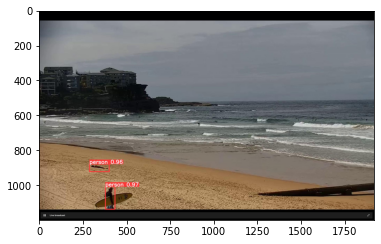

In [6]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp9/queenscliff_frame_000150.jpg')
plt.imshow(image)

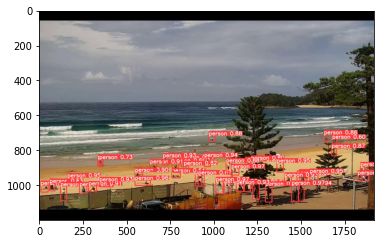

In [7]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp9/northsouthsteyne_frame_000101.jpg')
plt.imshow(image)

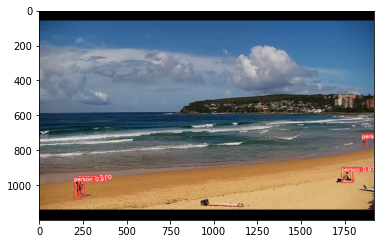

In [8]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp9/manly_frame_000051.jpg')
plt.imshow(image)

# TRAIN YOLOV5-M MODEL

In [59]:
#@title Setup Training YAML File
number_of_classes = 1 #@param {type:"integer"}
with open('new_train_yaml_mm', 'w+') as file:
    file.write(
        f"""
        # parameters
        nc: {number_of_classes}  # number of 
        depth_multiple: 0.67  # model depth multiple
        width_multiple: 0.75  # layer channel multiple
        anchors:
          - [10,13, 16,30, 33,23]  # P3/8
          - [30,61, 62,45, 59,119]  # P4/16
          - [116,90, 156,198, 373,326]  # P5/32

        # YOLOv5 v6.0 backbone
        backbone:
          # [from, number, module, args]
          [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
           [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
           [-1, 3, C3, [128]],
           [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
           [-1, 6, C3, [256]],
           [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
           [-1, 9, C3, [512]],
           [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
           [-1, 3, C3, [1024]],
           [-1, 1, SPPF, [1024, 5]],  # 9
          ]

        # YOLOv5 v6.0 head
        head:
          [[-1, 1, Conv, [512, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 6], 1, Concat, [1]],  # cat backbone P4
           [-1, 3, C3, [512, False]],  # 13

           [-1, 1, Conv, [256, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 4], 1, Concat, [1]],  # cat backbone P3
           [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

           [-1, 1, Conv, [256, 3, 2]],
           [[-1, 14], 1, Concat, [1]],  # cat head P4
           [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

           [-1, 1, Conv, [512, 3, 2]],
           [[-1, 10], 1, Concat, [1]],  # cat head P5
           [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

           [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
          ]
        """
    )

In [61]:
!python /root/seagull_eye/yolov5/train.py --img 416 --batch 16 --epochs 150 --data /root/seagull_eye/new_data_yaml --cfg /root/seagull_eye/new_train_yaml_mm --weights yolov5/yolov5m.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5/yolov5m.pt, cfg=/root/seagull_eye/new_train_yaml_mm, data=/root/seagull_eye/new_data_yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1,

## GET PERFORMANCE METRICS FOR YOLOV5-M TRAINED MODEL (TRAIN-VAL-TEST)

In [62]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt --data /root/seagull_eye/new_data_yaml --task train --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=train, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
train: Scanning /root/seagull_eye/train/labels.cache... 882 images, 0 background
                 Class     Images  Instances          P          R      mAP50   
                   all        882       8600      0.975      0.918      0.976       0.84
Speed: 0.1ms pre-process, 6.0ms inference, 3.4ms NMS per image at shape (32, 3, 416, 416)
Results saved to yolov5/runs/val/exp4


In [63]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt --data /root/seagull_eye/new_data_yaml --task val --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /root/seagull_eye/valid/labels.cache... 110 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   
                   all        110       1155      0.943      0.947      0.974      0.834
Speed: 0.8ms pre-process, 7.1ms inference, 8.2ms NMS per image at shape (32, 3, 416, 416)
Results saved to yolov5/runs/val/exp5


In [64]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt --data /root/seagull_eye/new_data_yaml --task test --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /root/seagull_eye/test/labels.cache... 111 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   
                   all        111       1193      0.943      0.954      0.977      0.845
Speed: 0.3ms pre-process, 7.4ms inference, 15.3ms NMS per image at shape (32, 3, 416, 416)
Results saved to yolov5/runs/val/exp6


# TRAIN YOLOV5-L MODEL

In [65]:
#@title Setup Training YAML File
number_of_classes = 1 #@param {type:"integer"}
with open('new_train_yaml_l', 'w+') as file:
    file.write(
        f"""
        # parameters
        nc: {number_of_classes}  # number of classes
        depth_multiple: 1.0  # model depth multiple
        width_multiple: 1.0  # layer channel multiple
        anchors:
          - [10,13, 16,30, 33,23]  # P3/8
          - [30,61, 62,45, 59,119]  # P4/16
          - [116,90, 156,198, 373,326]  # P5/32

        # YOLOv5 v6.0 backbone
        backbone:
          # [from, number, module, args]
          [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
           [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
           [-1, 3, C3, [128]],
           [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
           [-1, 6, C3, [256]],
           [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
           [-1, 9, C3, [512]],
           [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
           [-1, 3, C3, [1024]],
           [-1, 1, SPPF, [1024, 5]],  # 9
          ]

        # YOLOv5 v6.0 head
        head:
          [[-1, 1, Conv, [512, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 6], 1, Concat, [1]],  # cat backbone P4
           [-1, 3, C3, [512, False]],  # 13

           [-1, 1, Conv, [256, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 4], 1, Concat, [1]],  # cat backbone P3
           [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

           [-1, 1, Conv, [256, 3, 2]],
           [[-1, 14], 1, Concat, [1]],  # cat head P4
           [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

           [-1, 1, Conv, [512, 3, 2]],
           [[-1, 10], 1, Concat, [1]],  # cat head P5
           [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

           [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
          ]
        """
    )

In [ ]:
!python /root/seagull_eye/yolov5/train.py --img 416 --batch 16 --epochs 150 --data /root/seagull_eye/new_data_yaml --cfg /root/seagull_eye/new_train_yaml_l --weights yolov5/yolov5l.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5/yolov5l.pt, cfg=/root/seagull_eye/new_train_yaml_l, data=/root/seagull_eye/new_data_yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, 

## GET PERFORMANCE METRICS FOR YOLOV5-L TRAINED MODEL (TRAIN-VAL-TEST)

In [78]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp9/weights/best.pt --data /root/seagull_eye/new_data_yaml --task train --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp9/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=train, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_l summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
train: Scanning /root/seagull_eye/train/labels.cache... 882 images, 0 background
                 Class     Images  Instances          P          R      mAP50   
                   all        882       8600      0.989      0.926      0.973       0.86
Speed: 0.1ms pre-process, 11.0ms inference, 3.5ms NMS per image at shape (32, 3, 416, 416)
Results saved to yolov5/runs/val/exp7


In [79]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp9/weights/best.pt --data /root/seagull_eye/new_data_yaml --task val --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp9/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_l summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
val: Scanning /root/seagull_eye/valid/labels.cache... 110 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        110       1155      0.993      0.891      0.952      0.839
Speed: 0.5ms pre-process, 12.1ms

In [80]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp9/weights/best.pt --data /root/seagull_eye/new_data_yaml --task test --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp9/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_l summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
test: Scanning /root/seagull_eye/test/labels.cache... 111 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        111       1193      0.995      0.913      0.966      0.859
Speed: 0.8ms pre-process, 12.7m

In [9]:
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images' --weights '/root/seagull_eye/yolov5/runs/train/exp9/weights/best.pt' --img 416 --conf 0.5 --save-txt

detect: weights=['/root/seagull_eye/yolov5/runs/train/exp9/weights/best.pt'], source=/root/seagull_eye/test/images, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_l summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/111 /root/seagull_eye/test/images/deewhy2_frame_000005.jpg: 288x416 9 persons, 43.9ms
image 2/111 /root/seagull_eye/test/images/deewhy2_frame_000009.jpg: 288x416 9 persons, 24.8ms
image 3/111 /root/seagull_eye/test/images/deewhy2_frame_000019.jpg: 288x416 10 persons, 24.8ms
imag

In [ ]:
import cv2
from matplotlib import pyplot as plt
from PIL import Image

# This is needed to display the images.
%matplotlib inline

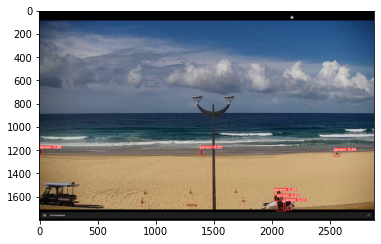

In [10]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp10/maroubranew_frame_000046.jpg')
plt.imshow(image)

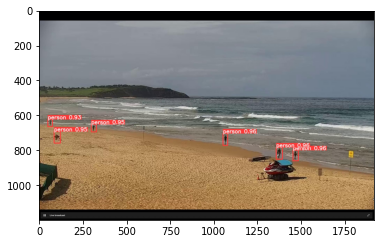

In [11]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp10/deewhy_frame_000161.jpg')
plt.imshow(image)

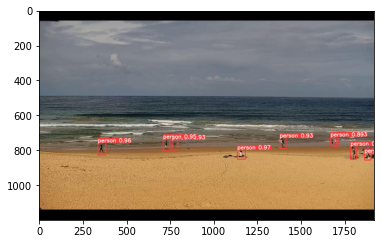

In [12]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp10/deewhy2_frame_000151.jpg')
plt.imshow(image)

# TRAIN YOLOV5-X MODEL

In [73]:
#@title Setup Training YAML File
number_of_classes = 1 #@param {type:"integer"}
with open('new_train_yaml_x', 'w+') as file:
    file.write(
        f"""
        # parameters
        nc: {number_of_classes}  # number of classes
        depth_multiple: 1.33  # model depth multiple
        width_multiple: 1.25  # layer channel multiple
        anchors:
          - [10,13, 16,30, 33,23]  # P3/8
          - [30,61, 62,45, 59,119]  # P4/16
          - [116,90, 156,198, 373,326]  # P5/32

        # YOLOv5 v6.0 backbone
        backbone:
          # [from, number, module, args]
          [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
           [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
           [-1, 3, C3, [128]],
           [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
           [-1, 6, C3, [256]],
           [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
           [-1, 9, C3, [512]],
           [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
           [-1, 3, C3, [1024]],
           [-1, 1, SPPF, [1024, 5]],  # 9
          ]

        # YOLOv5 v6.0 head
        head:
          [[-1, 1, Conv, [512, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 6], 1, Concat, [1]],  # cat backbone P4
           [-1, 3, C3, [512, False]],  # 13

           [-1, 1, Conv, [256, 1, 1]],
           [-1, 1, nn.Upsample, [None, 2, 'nearest']],
           [[-1, 4], 1, Concat, [1]],  # cat backbone P3
           [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

           [-1, 1, Conv, [256, 3, 2]],
           [[-1, 14], 1, Concat, [1]],  # cat head P4
           [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

           [-1, 1, Conv, [512, 3, 2]],
           [[-1, 10], 1, Concat, [1]],  # cat head P5
           [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

           [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
          ]
        """
    )

In [81]:
!python /root/seagull_eye/yolov5/train.py --img 416 --batch 16 --epochs 150 --data /root/seagull_eye/new_data_yaml --cfg /root/seagull_eye/new_train_yaml_x --weights yolov5/yolov5x.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5/yolov5x.pt, cfg=/root/seagull_eye/new_train_yaml_x, data=/root/seagull_eye/new_data_yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, 

## GET PERFORMANCE METRICS FOR YOLOV5-X TRAINED MODEL (TRAIN-VAL-TEST)

In [85]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt --data /root/seagull_eye/new_data_yaml --task train --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=train, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
train: Scanning /root/seagull_eye/train/labels.cache... 882 images, 0 background
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        882       8600      0.977       0.93      0.973      0.871
Speed: 0.1ms pre-process, 18.

In [86]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt --data /root/seagull_eye/new_data_yaml --task val --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
val: Scanning /root/seagull_eye/valid/labels.cache... 110 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        110       1155      0.982       0.89      0.947      0.844
Speed: 0.9ms pre-process, 19.1m

In [87]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt --data /root/seagull_eye/new_data_yaml --task test --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
test: Scanning /root/seagull_eye/test/labels.cache... 111 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        111       1193      0.988      0.874      0.936      0.838
Speed: 0.5ms pre-process, 20.3

In [13]:
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images' --weights '/root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt' --img 416 --conf 0.5 --save-txt

detect: weights=['/root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt'], source=/root/seagull_eye/test/images, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
image 1/111 /root/seagull_eye/test/images/deewhy2_frame_000005.jpg: 288x416 9 persons, 51.5ms
image 2/111 /root/seagull_eye/test/images/deewhy2_frame_000009.jpg: 288x416 9 persons, 41.1ms
image 3/111 /root/seagull_eye/test/images/deewhy2_frame_000019.jpg: 288x416 9 persons, 41.1ms
imag

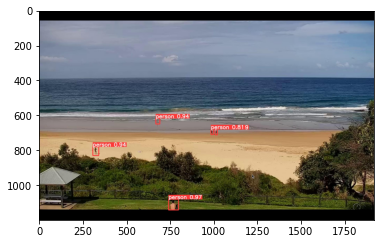

In [14]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp11/freshwater_frame_000062.jpg')
plt.imshow(image)

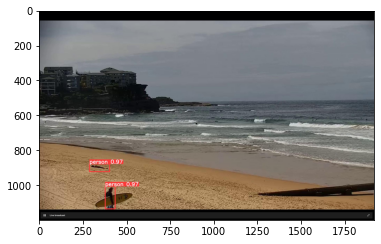

In [15]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp11/queenscliff_frame_000163.jpg')
plt.imshow(image)

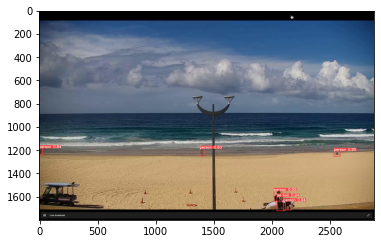

In [16]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp11/maroubranew_frame_000046.jpg')
plt.imshow(image)

# Test the trained model on sample images (YOLOv5 M model)

In [99]:
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images/freshwater_frame_000062.jpg' --weights '/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt' --img 416 --conf 0.5 --save-txt
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images/deewhy_frame_000122.jpg' --weights '/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt' --img 416 --conf 0.5 --save-txt
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images/queenscliff_frame_000163.jpg' --weights '/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt' --img 416 --conf 0.5 --save-txt
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images/manly_frame_000038.jpg' --weights '/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt' --img 416 --conf 0.5 --save-txt
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images/northsouthsteyne_frame_000101.jpg' --weights '/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt' --img 416 --conf 0.5 --save-txt

detect: weights=['/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt'], source=/root/seagull_eye/test/images/freshwater_frame_000062.jpg, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /root/seagull_eye/test/images/freshwater_frame_000062.jpg: 288x416 5 persons, 15.1ms
Speed: 0.3ms pre-process, 15.1ms inference, 1.3ms NMS per image at shape (1, 3, 416, 416)
Results saved to yolov5/runs/detect/exp3
1 labels saved to yolov5/runs/de

In [126]:
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images' --weights '/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt' --img 416 --conf 0.5 --save-txt

detect: weights=['/root/seagull_eye/yolov5/runs/train/exp5/weights/best.pt'], source=/root/seagull_eye/test/images, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/111 /root/seagull_eye/test/images/deewhy2_frame_000005.jpg: 288x416 9 persons, 15.2ms
image 2/111 /root/seagull_eye/test/images/deewhy2_frame_000009.jpg: 288x416 9 persons, 15.1ms
image 3/111 /root/seagull_eye/test/images/deewhy2_frame_000019.jpg: 288x416 10 persons, 15.1ms
ima

FIND FALSE POSITIVES AND NEGATIVES ON TEST DATA:

In [2]:
import os


def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    intersect_x_min = max(x1_min, x2_min)
    intersect_y_min = max(y1_min, y2_min)
    intersect_x_max = min(x1_max, x2_max)
    intersect_y_max = min(y1_max, y2_max)

    intersect_width = max(0, intersect_x_max - intersect_x_min)
    intersect_height = max(0, intersect_y_max - intersect_y_min)

    intersect_area = intersect_width * intersect_height

    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    iou = intersect_area / (box1_area + box2_area - intersect_area)
    return iou


def parse_annotation_file(file_path):
    bounding_boxes = []
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            values = line.strip().split()
            if len(values) == 5:  # Expected format: class x_center y_center width height
                class_name, x_center, y_center, width, height = values
                x_min = float(x_center) - (float(width) / 2)
                y_min = float(y_center) - (float(height) / 2)
                x_max = float(x_center) + (float(width) / 2)
                y_max = float(y_center) + (float(height) / 2)
                bounding_boxes.append((class_name, x_min, y_min, x_max, y_max))

    return bounding_boxes


def find_false_positives_and_negatives(annotation_dir, prediction_dir, iou_threshold):
    false_positives = []
    false_negatives = []

    annotation_files = os.listdir(annotation_dir)
    prediction_files = os.listdir(prediction_dir)

    for file_name in annotation_files:
        annotation_file_path = os.path.join(annotation_dir, file_name)
        prediction_file_path = os.path.join(prediction_dir, file_name)

        if os.path.isfile(annotation_file_path) and os.path.isfile(prediction_file_path):
            annotation_boxes = parse_annotation_file(annotation_file_path)
            prediction_boxes = parse_annotation_file(prediction_file_path)

            for annotation_box in annotation_boxes:
                iou_scores = [calculate_iou(annotation_box[1:], prediction_box[1:]) for prediction_box in prediction_boxes]
                max_iou = max(iou_scores) if iou_scores else 0.0

                if max_iou < iou_threshold:
                    false_negatives.append(file_name)
                    break

            for prediction_box in prediction_boxes:
                iou_scores = [calculate_iou(prediction_box[1:], annotation_box[1:]) for annotation_box in annotation_boxes]
                max_iou = max(iou_scores) if iou_scores else 0.0

                if max_iou < iou_threshold:
                    false_positives.append(file_name)
                    break

    return false_positives, false_negatives


# Example usage
annotation_dir = '/root/seagull_eye/test/labels'
prediction_dir = '/root/seagull_eye/yolov5/runs/detect/exp8/labels'
iou_threshold = 0.2
false_positives, false_negatives = find_false_positives_and_negatives(annotation_dir, prediction_dir, iou_threshold)

print("False Positives:")
print(false_positives)
print("False Negatives:")
print(false_negatives)





False Positives:
['northsouthsteyne_frame_000010.txt']
False Negatives:
['deewhy2_frame_000009.txt', 'deewhy2_frame_000027.txt', 'northsouthsteyne_frame_000029.txt', 'freshwater_frame_000042.txt', 'deewhy2_frame_000005.txt', 'deewhy2_frame_000131.txt', 'northsouthsteyne_frame_000070.txt', 'freshwater_frame_000037.txt', 'deewhy2_frame_000067.txt', 'northsouthsteyne_frame_000067.txt', 'freshwater_frame_000062.txt', 'deewhy2_frame_000052.txt', 'deewhy2_frame_000070.txt', 'deewhy2_frame_000151.txt', 'northsouthsteyne_frame_000010.txt', 'freshwater_frame_000066.txt', 'freshwater_frame_000087.txt', 'northsouthsteyne_frame_000031.txt', 'northsouthsteyne_frame_000084.txt', 'deewhy2_frame_000082.txt', 'deewhy2_frame_000118.txt', 'northsouthsteyne_frame_000053.txt', 'deewhy2_frame_000033.txt', 'deewhy2_frame_000086.txt', 'deewhy2_frame_000077.txt', 'freshwater_frame_000089.txt', 'northsouthsteyne_frame_000042.txt', 'northsouthsteyne_frame_000024.txt', 'northsouthsteyne_frame_000077.txt', 'deewhy

In [1]:
import os
import cv2



def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    intersect_x_min = max(x1_min, x2_min)
    intersect_y_min = max(y1_min, y2_min)
    intersect_x_max = min(x1_max, x2_max)
    intersect_y_max = min(y1_max, y2_max)

    intersect_width = max(0, intersect_x_max - intersect_x_min)
    intersect_height = max(0, intersect_y_max - intersect_y_min)

    intersect_area = intersect_width * intersect_height

    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    iou = intersect_area / (box1_area + box2_area - intersect_area)
    return iou


def parse_annotation_file(file_path):
    bounding_boxes = []
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            values = line.strip().split()
            if len(values) == 5:  # Expected format: class x_center y_center width height
                class_name, x_center, y_center, width, height = values
                x_min = float(x_center) - (float(width) / 2)
                y_min = float(y_center) - (float(height) / 2)
                x_max = float(x_center) + (float(width) / 2)
                y_max = float(y_center) + (float(height) / 2)
                bounding_boxes.append((class_name, x_min, y_min, x_max, y_max))

    return bounding_boxes


def find_false_positives_and_negatives(annotation_dir, prediction_dir, iou_threshold):
    false_positives = []
    false_negatives = []

    annotation_files = os.listdir(annotation_dir)
    prediction_files = os.listdir(prediction_dir)

    for file_name in annotation_files:
        annotation_file_path = os.path.join(annotation_dir, file_name)
        prediction_file_path = os.path.join(prediction_dir, file_name)

        if os.path.isfile(annotation_file_path) and os.path.isfile(prediction_file_path):
            annotation_boxes = parse_annotation_file(annotation_file_path)
            prediction_boxes = parse_annotation_file(prediction_file_path)

            has_false_positive = False
            has_false_negative = False

            for annotation_box in annotation_boxes:
                iou_scores = [calculate_iou(annotation_box[1:], prediction_box[1:]) for prediction_box in prediction_boxes]
                max_iou = max(iou_scores) if iou_scores else 0.0

                if max_iou < iou_threshold:
                    has_false_negative = True
                    break

            for prediction_box in prediction_boxes:
                iou_scores = [calculate_iou(prediction_box[1:], annotation_box[1:]) for annotation_box in annotation_boxes]
                max_iou = max(iou_scores) if iou_scores else 0.0

                if max_iou < iou_threshold:
                    has_false_positive = True
                    break

            if has_false_positive or has_false_negative:
                print("File:", file_name)
                if has_false_positive:
                    print("False Positives:")
                    for prediction_box in prediction_boxes:
                        iou_scores = [calculate_iou(prediction_box[1:], annotation_box[1:]) for annotation_box in annotation_boxes]
                        max_iou = max(iou_scores) if iou_scores else 0.0
                        if max_iou < iou_threshold:
                            print("Prediction:", prediction_box)
                if has_false_negative:
                    print("False Negatives:")
                    for annotation_box in annotation_boxes:
                        iou_scores = [calculate_iou(annotation_box[1:], prediction_box[1:]) for prediction_box in prediction_boxes]
                        max_iou = max(iou_scores) if iou_scores else 0.0
                        if max_iou < iou_threshold:
                            print("Annotation:", annotation_box)
                print()

            if has_false_positive:
                false_positives.append(file_name)
            if has_false_negative:
                false_negatives.append(file_name)

    return false_positives, false_negatives


# Example usage
annotation_dir = '/root/seagull_eye/test/labels'
prediction_dir = '/root/seagull_eye/yolov5/runs/detect/exp8/labels'
iou_threshold = 0.2
false_positives, false_negatives = find_false_positives_and_negatives(annotation_dir, prediction_dir, iou_threshold)

print("False Positives:")
print(false_positives)
print("False Negatives:")
print(false_negatives)



File: deewhy2_frame_000009.txt
False Negatives:
Annotation: ('0', 0.9898800000000001, 0.6801499999999999, 1.0, 0.712808)

File: deewhy2_frame_000027.txt
False Negatives:
Annotation: ('0', 0.9898800000000001, 0.6801499999999999, 1.0, 0.712808)

File: northsouthsteyne_frame_000029.txt
False Negatives:
Annotation: ('0', 0.392448, 0.7818415000000001, 0.406844, 0.8035245)
Annotation: ('0', 0.4207035, 0.71935, 0.43772449999999996, 0.757292)
Annotation: ('0', 0.7861615000000001, 0.7762830000000001, 0.8048805, 0.806233)
Annotation: ('0', 0.964005, 0.7803495, 0.9742550000000001, 0.8157165)

File: freshwater_frame_000042.txt
False Negatives:
Annotation: ('0', 0.5186820000000001, 0.5695165, 0.525104, 0.5913415)

File: deewhy2_frame_000005.txt
False Negatives:
Annotation: ('0', 0.9898800000000001, 0.6801499999999999, 1.0, 0.712808)

File: deewhy2_frame_000131.txt
False Negatives:
Annotation: ('0', 0.9898800000000001, 0.6801499999999999, 1.0, 0.712808)

File: northsouthsteyne_frame_000070.txt
False

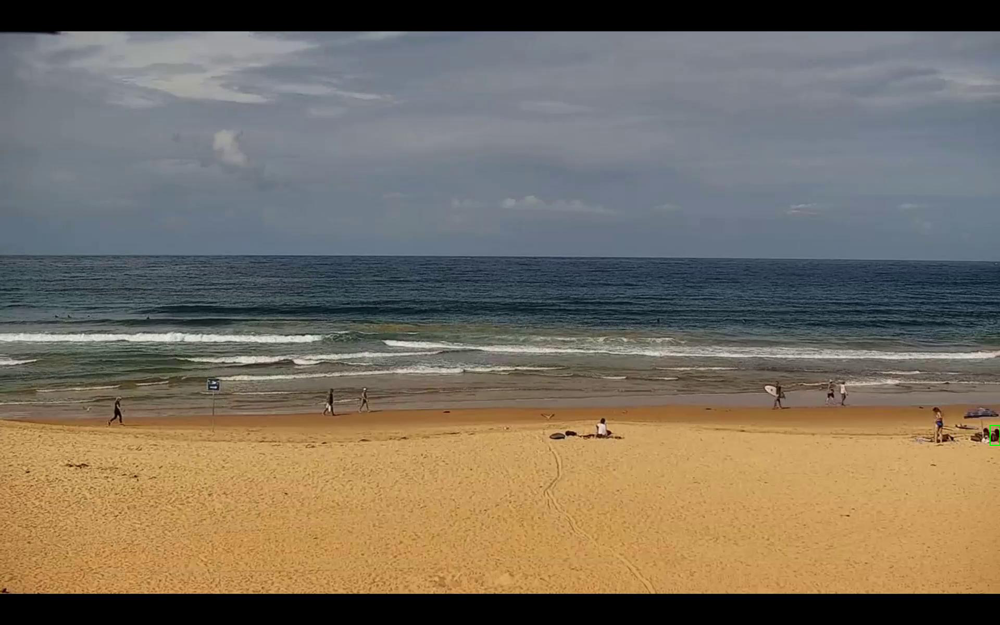

In [1]:
from PIL import Image, ImageDraw

# Load the image
image_path = '/root/seagull_eye/test/images/deewhy2_frame_000009.jpg'
image = Image.open(image_path)

# Create a draw object
draw = ImageDraw.Draw(image)

# Define the coordinates of the bounding box
x_min = 0.9898800000000001
y_min = 0.6801499999999999
x_max = 1.0
y_max = 0.712808

# Convert the coordinates to pixel values based on the image size
width, height = image.size
x_min_pixel = int(x_min * width)
y_min_pixel = int(y_min * height)
x_max_pixel = int(x_max * width)
y_max_pixel = int(y_max * height)

# Draw the bounding box on the image
draw.rectangle([(x_min_pixel, y_min_pixel), (x_max_pixel, y_max_pixel)], outline=(0, 255, 0), width=2)

# Show the image with the bounding box
image.show()



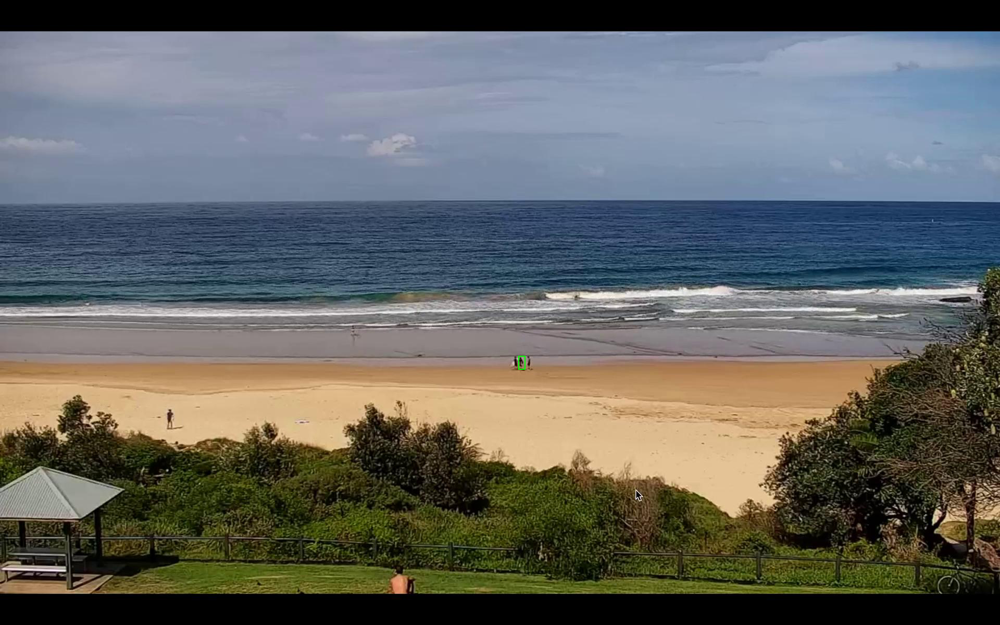

In [5]:
#File: freshwater_frame_000042.txt
#False Negatives:
#Annotation: ('0', 0.5186820000000001, 0.5695165, 0.525104, 0.5913415)

from PIL import Image, ImageDraw

# Load the image
image_path = '/root/seagull_eye/test/images/freshwater_frame_000042.jpg'
image = Image.open(image_path)

# Create a draw object
draw = ImageDraw.Draw(image)

# Define the coordinates of the bounding box
x_min = 0.5186820000000001
y_min = 0.5695165
x_max = 0.525104
y_max = 0.5913415

# Convert the coordinates to pixel values based on the image size
width, height = image.size
x_min_pixel = int(x_min * width)
y_min_pixel = int(y_min * height)
x_max_pixel = int(x_max * width)
y_max_pixel = int(y_max * height)

# Draw the bounding box on the image
draw.rectangle([(x_min_pixel, y_min_pixel), (x_max_pixel, y_max_pixel)], outline=(0, 255, 0), width=2)

# Show the image with the bounding box
image.show()

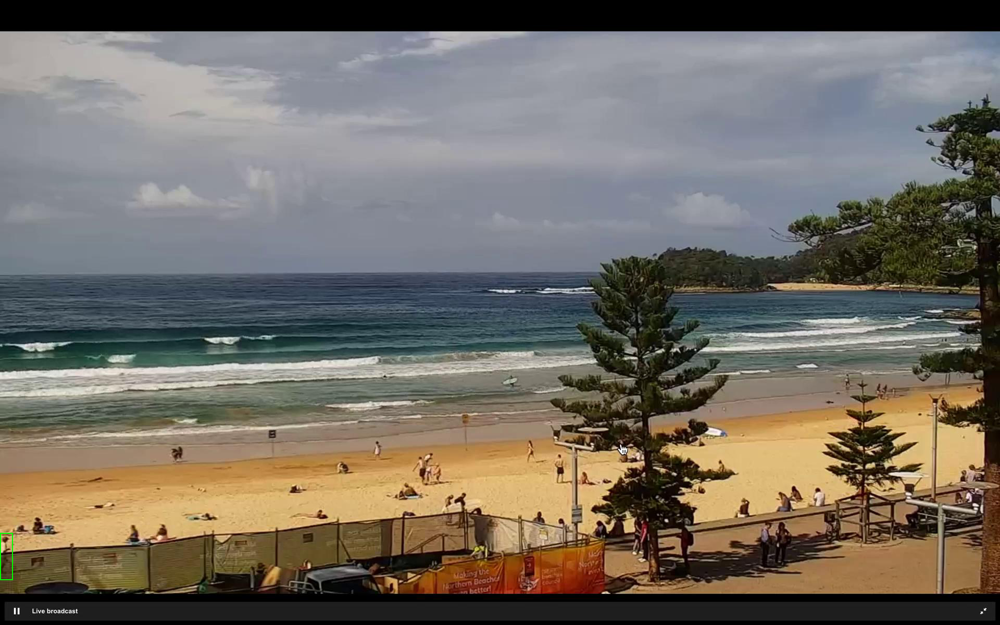

In [3]:
from PIL import Image, ImageDraw

# Load the image
image_path = '/root/seagull_eye/test/images/northsouthsteyne_frame_000010.jpg'
image = Image.open(image_path)

# Create a draw object
draw = ImageDraw.Draw(image)

# Define the coordinates of the bounding box
x_min = 1.9999999999881224e-08
y_min = 0.853333
x_max = 0.01302082
y_max = 0.928333

# Convert the coordinates to pixel values based on the image size
width, height = image.size
x_min_pixel = int(x_min * width)
y_min_pixel = int(y_min * height)
x_max_pixel = int(x_max * width)
y_max_pixel = int(y_max * height)

# Draw the bounding box on the image
draw.rectangle([(x_min_pixel, y_min_pixel), (x_max_pixel, y_max_pixel)], outline=(0, 255, 0), width=2)

# Show the image with the bounding box
image.show()


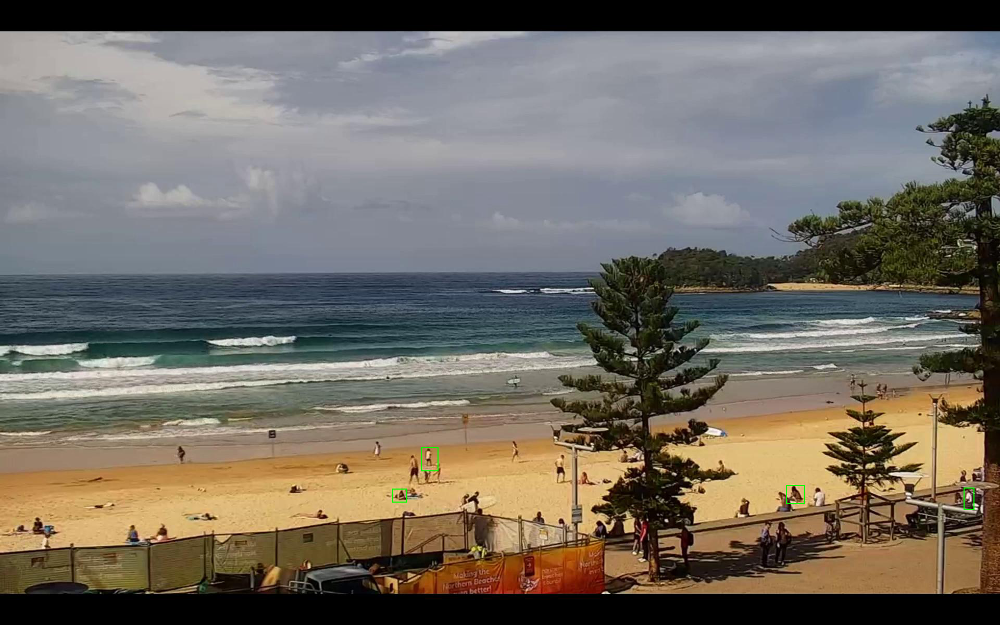

In [6]:
from PIL import Image, ImageDraw

#File: northsouthsteyne_frame_000067.txt
#False Negatives:
#Annotation: ('0', 0.392448, 0.7818415000000001, 0.406844, 0.8035245)
#Annotation: ('0', 0.42121850000000005, 0.7155830000000001, 0.4382395, 0.753525)
#Annotation: ('0', 0.7861615000000001, 0.7762830000000001, 0.8048805, 0.806233)
#Annotation: ('0', 0.964005, 0.7803495, 0.9742550000000001, 0.8157165)

# Load the image
image_path = '/root/seagull_eye/test/images/northsouthsteyne_frame_000067.jpg'
image = Image.open(image_path)

# Create a draw object
draw = ImageDraw.Draw(image)

# Define the coordinates of the bounding boxes
bounding_boxes = [
    (0.392448, 0.7818415000000001, 0.406844, 0.8035245),
    (0.42121850000000005, 0.7155830000000001, 0.4382395, 0.753525),
    (0.7861615000000001, 0.7762830000000001, 0.8048805, 0.806233),
    (0.964005, 0.7803495, 0.9742550000000001, 0.8157165)
]

# Convert the coordinates to pixel values based on the image size and draw the bounding boxes
width, height = image.size
for box in bounding_boxes:
    x_min, y_min, x_max, y_max = box
    x_min_pixel = int(x_min * width)
    y_min_pixel = int(y_min * height)
    x_max_pixel = int(x_max * width)
    y_max_pixel = int(y_max * height)
    draw.rectangle([(x_min_pixel, y_min_pixel), (x_max_pixel, y_max_pixel)], outline=(0, 255, 0), width=2)

# Show the image with the bounding boxes
image.show()

# Display result images

In [100]:
import cv2
from matplotlib import pyplot as plt
from PIL import Image

# This is needed to display the images.
%matplotlib inline

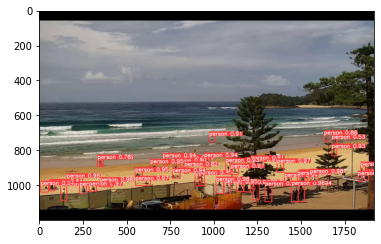

In [101]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp7/northsouthsteyne_frame_000101.jpg')
plt.imshow(image)

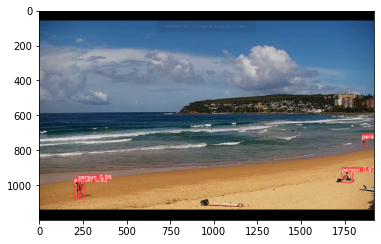

In [102]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp6/manly_frame_000038.jpg')
plt.imshow(image)

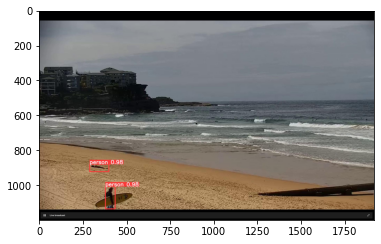

In [103]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp5/queenscliff_frame_000163.jpg')
plt.imshow(image)

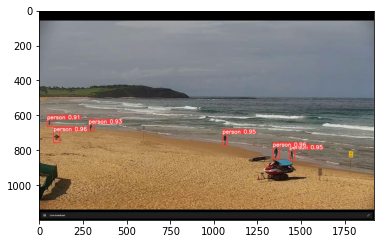

In [104]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp4/deewhy_frame_000122.jpg')
plt.imshow(image)

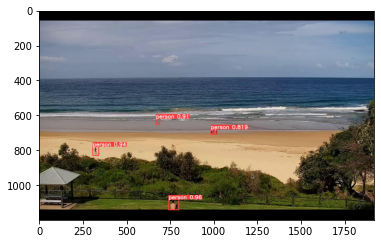

In [105]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp3/freshwater_frame_000062.jpg')
plt.imshow(image)

# Display performance analysis

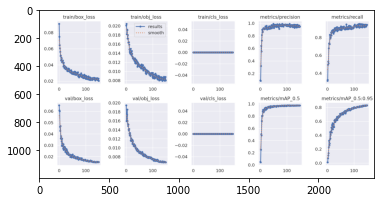

In [107]:
image = Image.open('/root/seagull_eye/yolov5/runs/train/exp5/results.png') 
plt.imshow(image)

HYPER PARAMETER TUNING (Default YAML from the hyps folder was modified with the new hyperparameters)

In [117]:
!python /root/seagull_eye/yolov5/train.py --img 416 --batch 16 --epochs 150 --data /root/seagull_eye/new_data_yaml --cfg /root/seagull_eye/new_train_yaml_mm --weights yolov5/yolov5m.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5/yolov5m.pt, cfg=/root/seagull_eye/new_train_yaml_mm, data=/root/seagull_eye/new_data_yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1,

In [118]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp17/weights/best.pt --data /root/seagull_eye/new_data_yaml --task train --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp17/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=train, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
train: Scanning /root/seagull_eye/train/labels.cache... 882 images, 0 background
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        882       8600      0.982      0.916      0.961      0.785
Speed: 0.2ms pre-process, 6.1

In [119]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt --data /root/seagull_eye/new_data_yaml --task val --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
val: Scanning /root/seagull_eye/valid/labels.cache... 110 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        110       1155      0.985      0.881      0.941      0.837
Speed: 0.4ms pre-process, 19.3m

In [120]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt --data /root/seagull_eye/new_data_yaml --task test --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp11/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-1.12.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
test: Scanning /root/seagull_eye/test/labels.cache... 111 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        111       1193      0.984      0.909       0.96      0.861
Speed: 0.4ms pre-process, 20.2

HYPER PARAMETER TUNING V2

In [8]:
!python /root/seagull_eye/yolov5/train.py --img 416 --batch 16 --epochs 150 --data /root/seagull_eye/new_data_yaml --cfg /root/seagull_eye/new_train_yaml_mm --weights yolov5/yolov5m.pt

train: weights=yolov5/yolov5m.pt, cfg=/root/seagull_eye/new_train_yaml_mm, data=/root/seagull_eye/new_data_yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 131, done.
remote: Counting objects: 100% (95/95), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 131 (delta 90), reused 94 (delta 90), pack-reused 36
Receiving objects: 100% (131/131), 23.75 KiB | 7.92 MiB/s, done.
Resolving deltas: 100% (108/108), completed with 23 local objects.
From https://githu

In [8]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp19/weights/best.pt --data /root/seagull_eye/new_data_yaml --task train --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp19/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=train, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
train: Scanning /root/seagull_eye/train/labels.cache... 882 images, 0 background
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        882       8600      0.978      0.917      0.961      0.792
Speed: 0.2ms pre-process, 4.5ms infer

In [9]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp19/weights/best.pt --data /root/seagull_eye/new_data_yaml --task val --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp19/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /root/seagull_eye/valid/labels.cache... 110 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   
                   all        110       1155      0.973      0.829      0.873      0.714
Speed: 0.3ms pre-process, 18.4ms infere

In [10]:
!python /root/seagull_eye/yolov5/val.py --weights /root/seagull_eye/yolov5/runs/train/exp19/weights/best.pt --data /root/seagull_eye/new_data_yaml --task test --img 416 --verbose

val: data=/root/seagull_eye/new_data_yaml, weights=['/root/seagull_eye/yolov5/runs/train/exp19/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /root/seagull_eye/test/labels.cache... 111 images, 0 backgrounds,
                 Class     Images  Instances          P          R      mAP50   
                   all        111       1193      0.982      0.928      0.972      0.808
Speed: 0.4ms pre-process, 30.3ms inference, 17.5ms NMS per image at shape (32, 3, 416, 416)
Results saved to runs/val/exp18


In [11]:
!python /root/seagull_eye/yolov5/detect.py --source '/root/seagull_eye/test/images' --weights '/root/seagull_eye/yolov5/runs/train/exp19/weights/best.pt' --img 416 --conf 0.5 --save-txt

detect: weights=['/root/seagull_eye/yolov5/runs/train/exp19/weights/best.pt'], source=/root/seagull_eye/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.2 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml_mm summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/111 /root/seagull_eye/test/images/deewhy2_frame_000005.jpg: 288x416 9 persons, 39.8ms
image 2/111 /root/seagull_eye/test/images/deewhy2_frame_000009.jpg: 288x416 9 persons, 14.3ms
image 3/111 /root/seagull_eye/test/images/deewhy2_frame_000019.jpg: 288x416 9 persons, 14.3ms
image 4/111 /root/

In [12]:
import cv2
from matplotlib import pyplot as plt
from PIL import Image

# This is needed to display the images.
%matplotlib inline

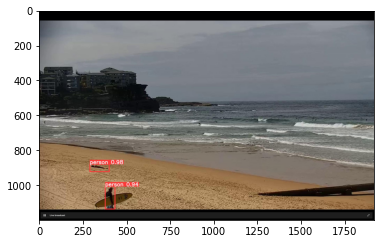

In [14]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp12/queenscliff_frame_000143.jpg')
plt.imshow(image)

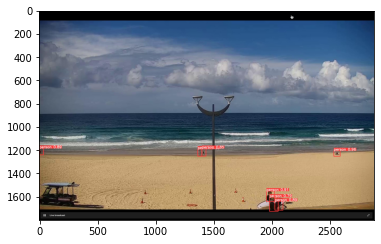

In [15]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp12/maroubranew_frame_000016.jpg')
plt.imshow(image)

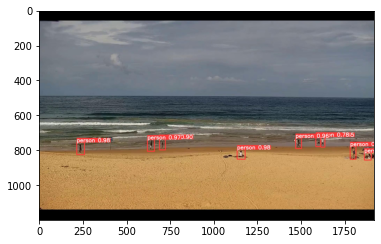

In [16]:
image = Image.open('/root/seagull_eye/yolov5/runs/detect/exp12/deewhy2_frame_000019.jpg')
plt.imshow(image)